In [0]:
###############
# Descripción:#
###############
# Autor: J Mendoza 
# MODELO.ipynb
# Permite visualizar el dataset UrbanSound8K, entrena un clasificador de audio y muestra resultados
###############
# Referencias:#
###############
# URBAN SOUND 8K CLASSIFICATION
# https://colab.research.google.com/github/pytorch/tutorials/blob/gh-pages/_downloads/audio_classifier_tutorial.ipynb#scrollTo=XQjw2I1H4P5S
# AUDIO CLASSIFIER TUTORIAL
# y https://www.kaggle.com/prabhavsingh/urbansound8k-classification
# Libreria: Keras

In [0]:
%matplotlib inline

In [0]:
!pip install torchaudio

In [0]:
# importación de librerías
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import Dataset
import torchaudio
import pandas as pd
import numpy as np

In [0]:
# se usa del GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


**Carga el dataset**

In [0]:
# descarga el dataset
!wget https://zenodo.org/record/1203745/files/UrbanSound8K.tar.gz -O urban8k.tgz

--2020-06-11 03:25:05--  https://zenodo.org/record/1203745/files/UrbanSound8K.tar.gz
Resolving zenodo.org (zenodo.org)... 188.184.117.155
Connecting to zenodo.org (zenodo.org)|188.184.117.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6023741708 (5.6G) [application/octet-stream]
Saving to: ‘urban8k.tgz’

urban8k.tgz         100%[===================>]   5.61G  18.7MB/s    in 7m 4s   

2020-06-11 03:32:10 (13.6 MB/s) - ‘urban8k.tgz’ saved [6023741708/6023741708]



**Extrae el dataset**

In [0]:
# descomprime el dataset
!tar -xzf urban8k.tgz

In [0]:
# muestra la descripción del dataset
!cat UrbanSound8K/UrbanSound8K_README.txt

UrbanSound8K

Created By
----------

Justin Salamon*^, Christopher Jacoby* and Juan Pablo Bello*
* Music and Audio Research Lab (MARL), New York University, USA
^ Center for Urban Science and Progress (CUSP), New York University, USA
http://serv.cusp.nyu.edu/projects/urbansounddataset
http://marl.smusic.nyu.edu/
http://cusp.nyu.edu/

Version 1.0


Description
-----------

This dataset contains 8732 labeled sound excerpts (<=4s) of urban sounds from 10 classes: air_conditioner, car_horn, 
children_playing, dog_bark, drilling, engine_idling, gun_shot, jackhammer, siren, and street_music. The classes are 
drawn from the urban sound taxonomy described in the following article, which also includes a detailed description of 
the dataset and how it was compiled:

J. Salamon, C. Jacoby and J. P. Bello, "A Dataset and Taxonomy for Urban Sound Research", 
22nd ACM International Conference on Multimedia, Orlando USA, Nov. 2014.

All excerpts are taken from field recordings uploaded to www.freesou

**Revisando el dataset**

In [0]:
# muestra contenido del archivo csv
csvData = pd.read_csv('UrbanSound8K/metadata/UrbanSound8K.csv')
print(csvData.iloc[0, :])

slice_file_name    100032-3-0-0.wav
fsID                         100032
start                             0
end                        0.317551
salience                          1
fold                              5
classID                           3
class                      dog_bark
Name: 0, dtype: object


In [0]:
# Reproduce 2 audios
import IPython.display as ipd
ipd.Audio('UrbanSound8K/audio/fold5/100852-0-0-19.wav') # aire acondicionado

In [0]:
ipd.Audio('UrbanSound8K/audio/fold1/108041-9-0-5.wav') # musica de calle

In [0]:
# se importan librerías adicionales
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import librosa
import librosa.display
from IPython.display import Image
from IPython.display import display
from IPython.display import Audio

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Text(0.5, 1.0, 'Label counts')

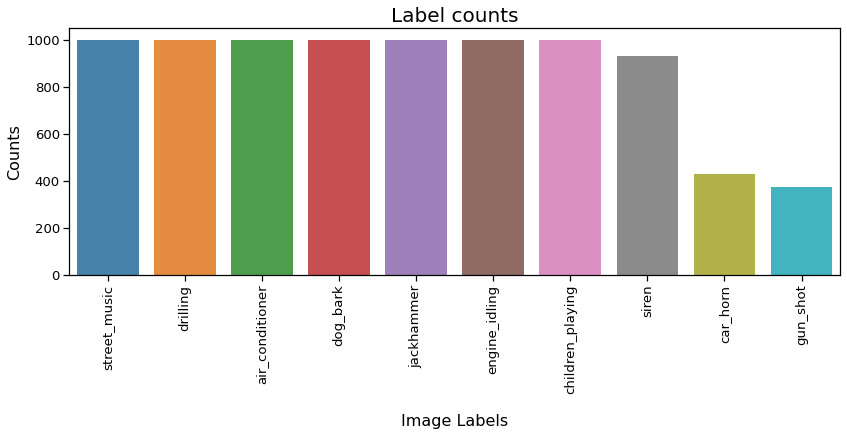

In [0]:
#Conformación de clases en el dataset (se observa un desbalance con las ultimas clases)
base_dir="UrbanSound8K"
metadata_file="UrbanSound8K/metadata/UrbanSound8K.csv"
metadata = pd.read_csv(metadata_file)
label_counts = metadata['class'].value_counts()
plt.figure(figsize = (12,6))
sns.set_context("notebook", font_scale=1.2)
sns.barplot(label_counts.index, label_counts.values, alpha = 0.9)
plt.xticks(rotation = 'vertical')
plt.xlabel('Image Labels', fontsize =16, labelpad=20)
plt.ylabel('Counts', fontsize = 16)
plt.tight_layout()
plt.title('Label counts', fontsize=20)

In [0]:
# se cargan y preprocesan los audios
wav_name = []
fold = []
wav_list = []
sr_list = []
audio_list = []
labels = metadata['class'].unique()
for label in labels:
    my_rows = metadata.loc[:,'class'] == label
    wav_name.append(list(metadata.loc[my_rows, 'slice_file_name'][0:3]))
    fold.append(list(metadata.loc[my_rows, 'fold'][0:3]))
wav_name = np.array(wav_name).flatten()
fold = np.array(fold).flatten()
for i in range(len(wav_name)):
    wav_file = os.path.join(base_dir,'audio', 'fold'+str(fold[i]), wav_name[i])
    y, sr = librosa.load(wav_file)
    audio_list.append(y)
    sr_list.append(sr)
    wav_list.append(wav_file)

<Figure size 432x288 with 0 Axes>

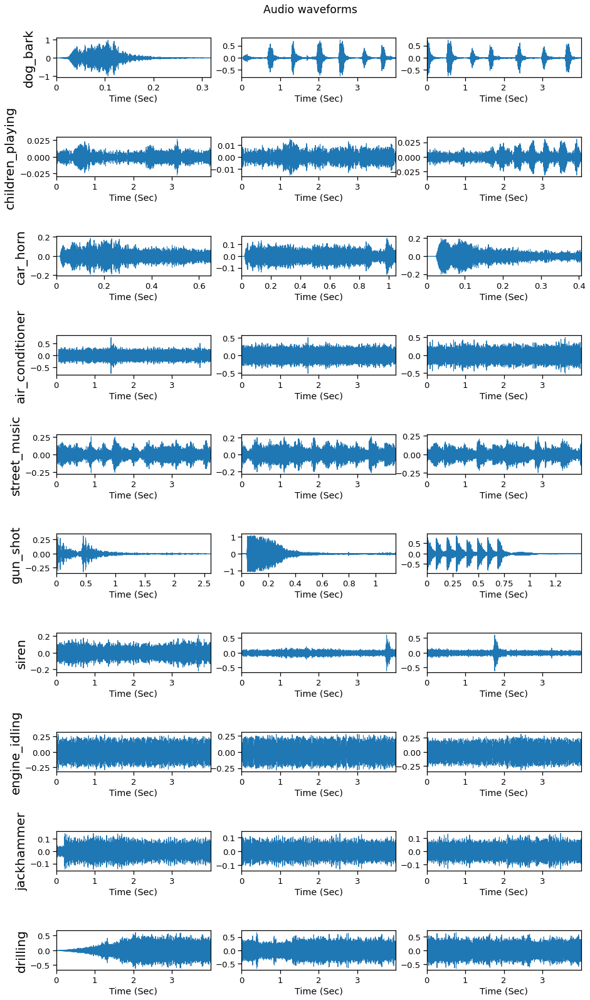

In [0]:
# Mostrando los tracks en el dominio del tiempo
plt.figure()
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(15,25))
fig.subplots_adjust(hspace=1.5, top=0.95)
fig.suptitle('Audio waveforms')
my_label = 0
for i, y, sr in zip(range(0,30), audio_list, sr_list):
    i+=1
    plt.subplot(10, 3, i)
    librosa.display.waveplot(y, sr=sr)
    plt.xlabel('Time (Sec)')
    if i % 3 ==1:
        plt.ylabel(labels[my_label], fontsize=20)
        my_label +=1

<Figure size 432x288 with 0 Axes>

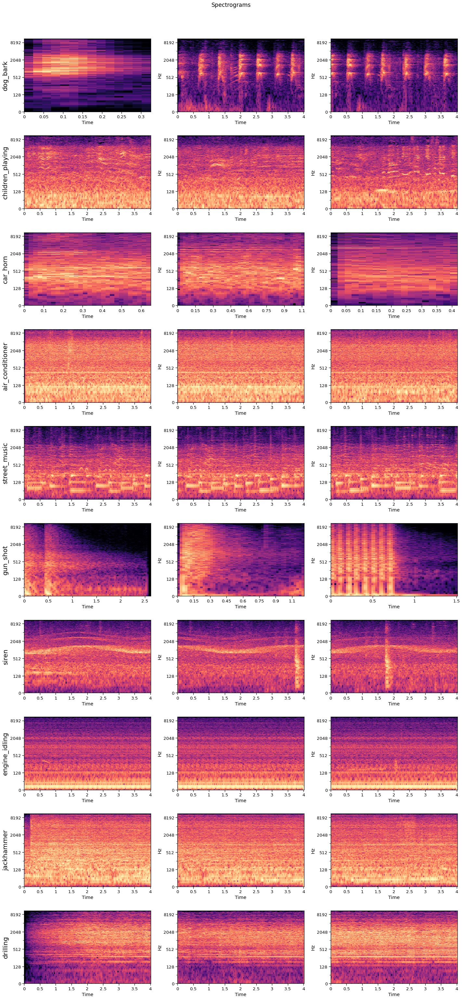

In [0]:
#Mostrando los tracks como espectrogramas (s,Hz,log(A))
plt.figure()
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(20,45))
fig.subplots_adjust(hspace=1)
fig.suptitle('Spectrograms')
my_label = 0
for i, y, sr in zip(range(0,30), audio_list, sr_list):
    i+=1
    plt.subplot(10, 3, i)
    log_S = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='log')
    locs, y_labels = plt.yticks()
    fewer_locs = locs[::2]
    plt.yticks(fewer_locs)
    if i % 3 ==1:
        plt.ylabel(labels[my_label], fontsize=20)
        my_label +=1
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

<Figure size 432x288 with 0 Axes>

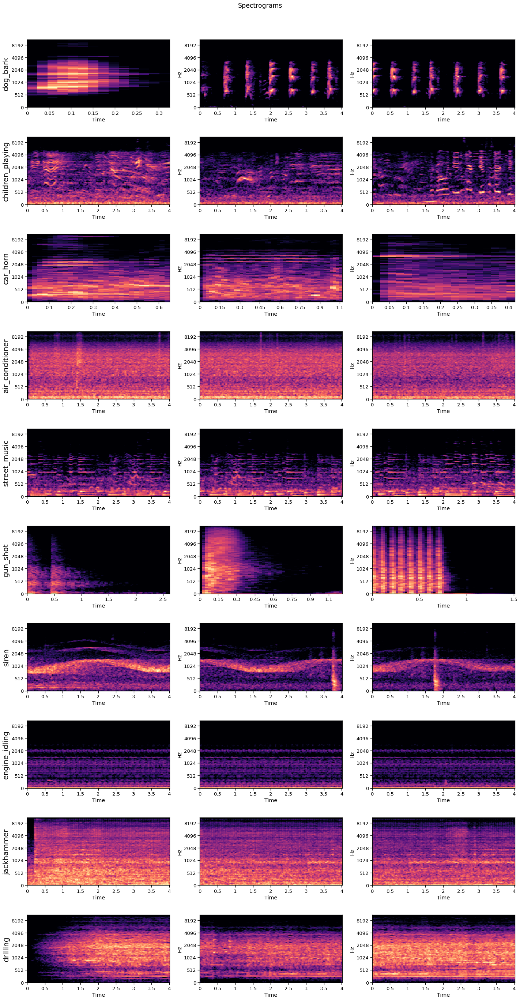

In [0]:
#Mostrando los tracks como espectrogramas (s,mel,log(A))
plt.figure()
fig, axes = plt.subplots(nrows=10, ncols=3, figsize=(20,40))
fig.subplots_adjust(hspace=1)
fig.suptitle('Spectrograms')
my_label = 0
for i, y, sr in zip(range(0,30), audio_list, sr_list):
    i+=1
    plt.subplot(10, 3, i)
    S = librosa.feature.melspectrogram(y, sr=sr, n_mels=128)
    log_S = librosa.amplitude_to_db(S, ref=np.max)
    librosa.display.specshow(log_S, sr=sr, x_axis='time', y_axis='mel')
    if i % 3 ==1:
        plt.ylabel(labels[my_label], fontsize=20)
        my_label +=1
fig.tight_layout(rect=[0, 0.03, 1, 0.95])

**Entrenamiento de modelo**

In [0]:
# Librerias adicionales
import pandas as pd
import numpy as np

pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV

from sklearn.preprocessing import MinMaxScaler

In [0]:
# Librerias adicionales
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Flatten, Dense, MaxPool2D, Dropout
from tensorflow.keras.utils import to_categorical 

from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

In [0]:
# Librerias adicionales

import os
import librosa
import librosa.display
import glob 
import skimage

In [0]:
# se lee el dataframe
df = pd.read_csv("UrbanSound8K/metadata/UrbanSound8K.csv")
df.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [0]:
feature = []
label = []
def parser(row):
    # Funcion para cargar archivos y extraer caracteristicas
    for i in range(8732):
        file_name = "UrbanSound8K/audio/fold" + str(df["fold"][i]) + '/' + df["slice_file_name"][i]
        X, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mels = np.mean(librosa.feature.melspectrogram(y=X, sr=sample_rate).T,axis=0)        
        feature.append(mels)
        label.append(df["classID"][i])
    return [feature, label]

In [0]:
# se aplica la función anterior
temp = parser(df)

In [0]:
temp = np.array(temp)
data = temp.transpose()

In [0]:
X_ = data[:, 0]
Y = data[:, 1]
print(X_.shape, Y.shape)
X = np.empty([8732, 128])

(8732,) (8732,)


In [0]:
for i in range(8732):
    X[i] = (X_[i])

In [0]:
Y = to_categorical(Y)

In [0]:
'''Final Data'''
print(X.shape)
print(Y.shape)

(8732, 128)
(8732, 10)


In [0]:
# se conforman los conjuntos de entrenamiento y prueba
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, random_state = 1)

In [0]:
# se ajusta el tamaño de los sets
X_train = X_train.reshape(6549, 16, 8, 1)
X_test = X_test.reshape(2183, 16, 8, 1)

In [0]:
input_dim = (16, 8, 1)

In [0]:
# Crea el modelo en tensorflow keras
model = Sequential()

model.add(Conv2D(64, (3, 3), padding = "same", activation = "tanh", input_shape = input_dim))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Conv2D(128, (3, 3), padding = "same", activation = "tanh"))
model.add(MaxPool2D(pool_size=(2, 2)))
model.add(Dropout(0.1))
model.add(Flatten())
model.add(Dense(1024, activation = "tanh"))
model.add(Dense(10, activation = "softmax"))

model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 8, 64)         640       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 8, 4, 64)          0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 4, 128)         73856     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 4, 2, 128)         0         
_________________________________________________________________
dropout (Dropout)            (None, 4, 2, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 1024)              0         
_________________________________________________________________
dense (Dense)                (None, 1024)              1

In [0]:
# se entrena el modelo en 90 epocas y batch size de 50
model.fit(X_train, Y_train, epochs = 90, batch_size = 50, validation_data = (X_test, Y_test))

Epoch 1/90
131/131 [==============================] - 1s 5ms/step - loss: 1.5296 - accuracy: 0.4770 - val_loss: 1.3432 - val_accuracy: 0.5598
Epoch 2/90
131/131 [==============================] - 1s 4ms/step - loss: 1.1594 - accuracy: 0.6106 - val_loss: 1.1051 - val_accuracy: 0.6354
Epoch 3/90
131/131 [==============================] - 1s 4ms/step - loss: 0.9807 - accuracy: 0.6683 - val_loss: 1.0922 - val_accuracy: 0.6340
Epoch 4/90
131/131 [==============================] - 1s 4ms/step - loss: 0.8413 - accuracy: 0.7151 - val_loss: 1.0428 - val_accuracy: 0.6720
Epoch 5/90
131/131 [==============================] - 1s 4ms/step - loss: 0.7867 - accuracy: 0.7360 - val_loss: 0.9233 - val_accuracy: 0.7082
Epoch 6/90
131/131 [==============================] - 1s 4ms/step - loss: 0.7105 - accuracy: 0.7644 - val_loss: 0.8622 - val_accuracy: 0.7288
Epoch 7/90
131/131 [==============================] - 1s 4ms/step - loss: 0.6376 - accuracy: 0.7881 - val_loss: 0.8630 - val_accuracy: 0.7357
Epoch 

In [0]:
# se muestra el accuracy final obtenido
predictions = model.predict(X_test)
score = model.evaluate(X_test, Y_test)
print(score)

69/69 [==============================] - 0s 2ms/step - loss: 0.9151 - accuracy: 0.8594
[0.9151397943496704, 0.859367847442627]


In [0]:
# Guardar el Modelo
model.save('CNN_Audio.h5')

**Prediction**

In [0]:
i=97
file_name = "UrbanSound8K/audio/fold" + str(df["fold"][i]) + '/' + df["slice_file_name"][i]
# Ejemplo de prediccion 
X, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
mels = np.mean(librosa.feature.melspectrogram(y=X, sr=sample_rate).T,axis=0)        
prove_feature = mels
prove_label = df["classID"][i]
print(file_name)
class_dict = ['air_conditioner','car_horn','children_playing','dog_bark','drilling','engine_idling','gun_shot','jackhammer','siren','street_music']
print('Clase real :',class_dict[prove_label])
prove_feature = np.array(prove_feature)
data_feature = prove_feature.transpose()
data_feature = data_feature.reshape(1, 16, 8, 1)
prediction = model.predict(data_feature)
print('Clase predicha :',class_dict[np.argmax(prediction, axis=1)[0]])
ipd.Audio(file_name)

UrbanSound8K/audio/fold7/101848-9-0-3.wav
Clase real : street_music
Clase predicha : street_music


In [0]:
i=289
file_name = "UrbanSound8K/audio/fold" + str(df["fold"][i]) + '/' + df["slice_file_name"][i]
# Ejemplo de prediccion 
X, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
mels = np.mean(librosa.feature.melspectrogram(y=X, sr=sample_rate).T,axis=0)        
prove_feature = mels
prove_label = df["classID"][i]
print(file_name)
class_dict = ['air_conditioner','car_horn','children_playing','dog_bark','drilling','engine_idling','gun_shot','jackhammer','siren','street_music']
print('Clase real :',class_dict[prove_label])
prove_feature = np.array(prove_feature)
data_feature = prove_feature.transpose()
data_feature = data_feature.reshape(1, 16, 8, 1)
prediction = model.predict(data_feature)
print('Clase predecida :',class_dict[np.argmax(prediction, axis=1)[0]])
ipd.Audio(file_name)

UrbanSound8K/audio/fold7/104625-4-0-52.wav
Clase real : drilling
Clase predecida : drilling


In [0]:
i=525
file_name = "UrbanSound8K/audio/fold" + str(df["fold"][i]) + '/' + df["slice_file_name"][i]
# Ejemplo de prediccion 
X, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
mels = np.mean(librosa.feature.melspectrogram(y=X, sr=sample_rate).T,axis=0)        
prove_feature = mels
prove_label = df["classID"][i]
print(file_name)
class_dict = ['air_conditioner','car_horn','children_playing','dog_bark','drilling','engine_idling','gun_shot','jackhammer','siren','street_music']
print('Clase real :',class_dict[prove_label])
prove_feature = np.array(prove_feature)
data_feature = prove_feature.transpose()
data_feature = data_feature.reshape(1, 16, 8, 1)
prediction = model.predict(data_feature)
print('Clase predecida :',class_dict[np.argmax(prediction, axis=1)[0]])
ipd.Audio(file_name)

UrbanSound8K/audio/fold7/107357-8-1-16.wav
Clase real : siren
Clase predecida : siren
